# Importando Bibliotecas

In [1]:
import warnings
import missingno
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS

warnings.filterwarnings('ignore')

# Lendo os Dados

In [2]:
df = pd.read_csv('../content/df_final.csv', low_memory=False, delimiter=';')

# EDA

## Informações Estatísticas Gerais

In [3]:
df.describe(include='all')

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,cast,crew
count,47838,4574,4.783800e+04,47838,8883,4.783800e+04,47821,47827,46629,46842,...,47834,47752,21772,47834,47834,47834.000000,47834.000000,46628,46628,46628
unique,2,1695,NaN,4179,8506,NaN,46517,89,43371,45434,...,2094,6,21180,43222,2,NaN,NaN,25989,43019,44669
top,False,"{'id': 34055, 'name': 'Pokémon Collection', 'p...",NaN,"[{'id': 18, 'name': 'Drama'}]",https://www.netflix.com/title/80237870,NaN,tt1180333,en,Blackout,No overview found.,...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Which one is the first to return - memory or t...,Blackout,False,NaN,NaN,[],[],[]
freq,47829,34,NaN,5270,16,NaN,27,34120,30,136,...,22829,47374,27,31,47737,NaN,NaN,14889,2491,798
mean,NaN,NaN,4.570434e+06,NaN,NaN,1.203508e+05,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,5.635173,144.204729,NaN,NaN,NaN
std,NaN,NaN,1.858626e+07,NaN,NaN,1.321550e+05,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,1.918953,670.828522,NaN,NaN,NaN
min,NaN,NaN,0.000000e+00,NaN,NaN,2.000000e+00,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,NaN,NaN,NaN
25%,NaN,NaN,0.000000e+00,NaN,NaN,2.734450e+04,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,5.000000,3.000000,NaN,NaN,NaN
50%,NaN,NaN,0.000000e+00,NaN,NaN,6.377200e+04,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,6.000000,10.000000,NaN,NaN,NaN
75%,NaN,NaN,0.000000e+00,NaN,NaN,1.743408e+05,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,6.800000,38.000000,NaN,NaN,NaN


In [4]:
df.columns

Index(['adult', 'belongs_to_collection', 'budget', 'genres', 'homepage', 'id',
       'imdb_id', 'original_language', 'original_title', 'overview',
       'popularity', 'poster_path', 'production_companies',
       'production_countries', 'release_date', 'revenue', 'runtime',
       'spoken_languages', 'status', 'tagline', 'title', 'video',
       'vote_average', 'vote_count', 'keywords', 'cast', 'crew'],
      dtype='object')

## Dicionário de Dados


* **adult**: Se é um filme adulto ou não
* **belongs_to_collection**: Lista de dicionários com o Título da Coleção (Ex: Harry Potter e a Pedra Filosofal pertence a coleção Harry Potter)
* **budget**: Orçamento do filme (em dólares)
* **cast**: Elenco do filme
* **crew**: Equipe de filmagem do filme
* **genres**: Lista de dicionários com todos os gêneros associados ao filme
* **homepage**: Site oficial do filme
* **id**: Identificação do filme
* **imdb_id**: Identificação do filme no IMDb (Internet Movie Database)
* **keywords**: Lista de dicionários com todas as palavras-chave do filme
* **original_language**: Idioma original do filme
* **original_title**: Título original do filme
* **overview**: Breve descrição do filme
* **popularity**: Pontuação dada pelo TMDb
* **poster_path**: Path do poster do filme
* **production_companies**: Produtoras envolvidas na produção do filme
* **production_countries**: País onde o filme foi produzido
* **release_date**: Data de Lançamento do filme
* **revenue**: Receita total do filme (em dólares)
* **runtime**: Tempo de execução do filme (em minutos)
* **spoken_languages**: Idiomas falados no filme
* **status**: Status do filme (lançado, para ser lançado, anunciado, etc)
* **tagline**: Tagline do filme
* **title**: Título oficial do filme
* **video**: Se o filme possui vídeo no TMDb
* **vote_average**: Avaliação média do filme
* **vote_count**: Número de votos contabilizados pelo TMDb

### Dados Faltantes

In [5]:
df.isnull().sum().sort_values(ascending=False)

belongs_to_collection    43264
homepage                 38955
tagline                  26066
crew                      1210
keywords                  1210
cast                      1210
original_title            1209
overview                   996
poster_path                399
runtime                    268
release_date                88
status                      86
imdb_id                     17
original_language           11
vote_count                   4
vote_average                 4
video                        4
title                        4
production_countries         4
spoken_languages             4
revenue                      4
production_companies         4
popularity                   4
id                           0
genres                       0
budget                       0
adult                        0
dtype: int64

<Axes: >

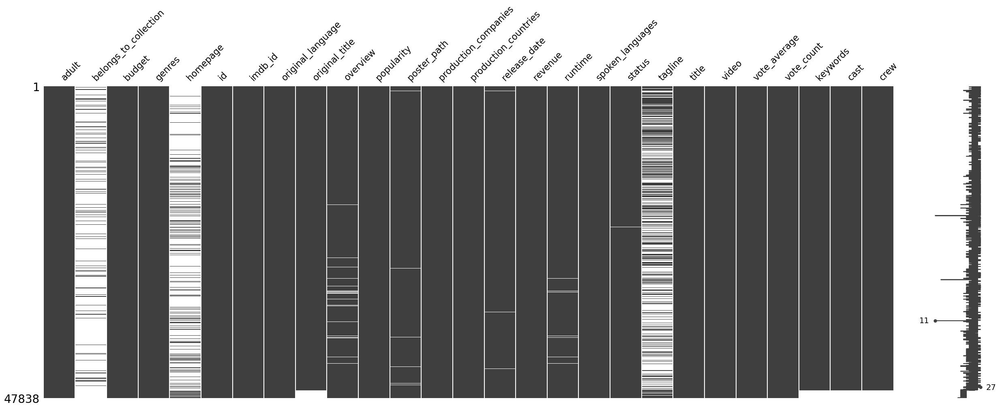

In [6]:
missingno.matrix(df, figsize=(30,10))

In [7]:
df[df.isnull().any(axis=1)].head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,cast,crew
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862.0,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Toy Story,False,7.7,5415.0,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de..."
1,False,NaN,65000000,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844.0,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413.0,"[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de..."
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",0,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602.0,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92.0,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de..."
3,False,NaN,16000000,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357.0,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34.0,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de..."
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",0,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862.0,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173.0,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n...","[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de..."


In [8]:
linhas, colunas = df.shape

In [9]:
faltantes_percentual = (df.isnull().sum()/linhas)*100
faltantes_percentual

adult                     0.000000
belongs_to_collection    90.438563
budget                    0.000000
genres                    0.000000
homepage                 81.431080
id                        0.000000
imdb_id                   0.035537
original_language         0.022994
original_title            2.527280
overview                  2.082027
popularity                0.008362
poster_path               0.834065
production_companies      0.008362
production_countries      0.008362
release_date              0.183954
revenue                   0.008362
runtime                   0.560224
spoken_languages          0.008362
status                    0.179773
tagline                  54.488064
title                     0.008362
video                     0.008362
vote_average              0.008362
vote_count                0.008362
keywords                  2.529370
cast                      2.529370
crew                      2.529370
dtype: float64

### Dados Duplicados

In [10]:
df.duplicated().sum()

1232

In [11]:
df[df.duplicated()]

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,cast,crew
677,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10749, 'n...",NaN,105045.0,tt0111613,de,Das Versprechen,"East-Berlin, 1961, shortly after the erection ...",...,"[{'iso_639_1': 'de', 'name': 'Deutsch'}]",Released,"A love, a hope, a wall.",The Promise,False,5.00,1.0,"[{'id': 7059, 'name': 'anti-communism'}, {'id'...","[{'cast_id': 5, 'character': 'Sophie II', 'cre...","[{'credit_id': '52fe4a44c3a36847f81c463f', 'de..."
678,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10749, 'n...",NaN,105045.0,tt0111613,de,Das Versprechen,"East-Berlin, 1961, shortly after the erection ...",...,"[{'iso_639_1': 'de', 'name': 'Deutsch'}]",Released,"A love, a hope, a wall.",The Promise,False,5.00,1.0,"[{'id': 7059, 'name': 'anti-communism'}, {'id'...","[{'cast_id': 5, 'character': 'Sophie II', 'cre...","[{'credit_id': '52fe4a44c3a36847f81c463f', 'de..."
679,False,NaN,0,"[{'id': 18, 'name': 'Drama'}, {'id': 10749, 'n...",NaN,105045.0,tt0111613,de,Das Versprechen,"East-Berlin, 1961, shortly after the erection ...",...,"[{'iso_639_1': 'de', 'name': 'Deutsch'}]",Released,"A love, a hope, a wall.",The Promise,False,5.00,1.0,"[{'id': 7059, 'name': 'anti-communism'}, {'id'...","[{'cast_id': 5, 'character': 'Sophie II', 'cre...","[{'credit_id': '52fe4a44c3a36847f81c463f', 'de..."
843,False,NaN,0,"[{'id': 18, 'name': 'Drama'}]",NaN,132641.0,tt0046468,ja,Tsuma,"Ten years into a marriage, the wife is disappo...",...,"[{'iso_639_1': 'ja', 'name': '日本語'}]",Released,NaN,Wife,False,0.00,0.0,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 4, 'character': 'Mihoko Nakagawa'...","[{'credit_id': '52fe4b9ac3a368484e190d25', 'de..."
844,False,NaN,0,"[{'id': 18, 'name': 'Drama'}]",NaN,132641.0,tt0046468,ja,Tsuma,"Ten years into a marriage, the wife is disappo...",...,"[{'iso_639_1': 'ja', 'name': '日本語'}]",Released,NaN,Wife,False,0.00,0.0,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 4, 'character': 'Mihoko Nakagawa'...","[{'credit_id': '56365ed9925141285701b06e', 'de..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47690,False,NaN,0,"[{'id': 53, 'name': 'Thriller'}]",NaN,750253.0,tt13234058,en,NaN,"When a man's only son goes missing, he travels...",...,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,A groundbreaking achievement in filmmaking whe...,My Son,False,6.26,346.0,NaN,NaN,NaN
47691,False,NaN,0,"[{'id': 53, 'name': 'Thriller'}]",NaN,750253.0,tt13234058,en,NaN,"When a man's only son goes missing, he travels...",...,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,A groundbreaking achievement in filmmaking whe...,My Son,False,6.26,346.0,NaN,NaN,NaN
47692,False,NaN,0,"[{'id': 53, 'name': 'Thriller'}]",NaN,750253.0,tt13234058,en,NaN,"When a man's only son goes missing, he travels...",...,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,A groundbreaking achievement in filmmaking whe...,My Son,False,6.26,346.0,NaN,NaN,NaN
47693,False,NaN,0,"[{'id': 53, 'name': 'Thriller'}]",NaN,750253.0,tt13234058,en,NaN,"When a man's only son goes missing, he travels...",...,"[{'english_name': 'English', 'iso_639_1': 'en'...",Released,A groundbreaking achievement in filmmaking whe...,My Son,False,6.26,346.0,NaN,NaN,NaN


In [12]:
df.drop_duplicates(subset=['original_title'], inplace=True)

#### **adult**: Se é um filme adulto ou não

In [13]:
df['adult'].head()

0    False
1    False
2    False
3    False
4    False
Name: adult, dtype: bool

In [14]:
df['adult'].dtypes

dtype('bool')

In [15]:
df['adult'].nunique()

2

In [16]:
df['adult'].unique()

array([False,  True])

In [17]:
wrong_values = [' - Written by Ørnås',
       ' Rune Balot goes to a casino connected to the October corporation to try to wrap up her case once and for all.',
       ' Avalanche Sharks tells the story of a bikini contest that turns into a horrifying affair when it is hit by a shark avalanche.']
for i in df['adult']:
    if i in wrong_values:
      df.loc[df['adult'] == i][['adult']] = False

In [18]:
df['adult'].nunique()

2

In [19]:
df['adult'].unique()

array([False,  True])

#### **belongs_to_collection**: Lista de dicionários com o Título da Coleção (Ex: Harry Potter e a Pedra Filosofal pertence a coleção Harry Potter)

In [20]:
df['belongs_to_collection'].head()

0    {'id': 10194, 'name': 'Toy Story Collection', ...
1                                                  NaN
2    {'id': 119050, 'name': 'Grumpy Old Men Collect...
3                                                  NaN
4    {'id': 96871, 'name': 'Father of the Bride Col...
Name: belongs_to_collection, dtype: object

In [21]:
df['belongs_to_collection'].dtypes

dtype('O')

In [22]:
df['belongs_to_collection'].nunique()

1682

In [23]:
df['belongs_to_collection'].unique()

array(["{'id': 10194, 'name': 'Toy Story Collection', 'poster_path': '/7G9915LfUQ2lVfwMEEhDsn3kT4B.jpg', 'backdrop_path': '/9FBwqcd9IRruEDUrTdcaafOMKUq.jpg'}",
       nan,
       "{'id': 119050, 'name': 'Grumpy Old Men Collection', 'poster_path': '/nLvUdqgPgm3F85NMCii9gVFUcet.jpg', 'backdrop_path': '/hypTnLot2z8wpFS7qwsQHW1uV8u.jpg'}",
       ...,
       "{'id': 148603, 'name': 'Ducobu Collection', 'poster_path': '/rd7AWZUy2QFPIblNWToVmdfXQcA.jpg', 'backdrop_path': '/7mzKmoIrvGapvsSbAVlX4HtCnFj.jpg'}",
       "{'id': 152918, 'name': 'Mister Blot Collection', 'poster_path': '/44PYEwwjGts8pAob59RHd6zlkKc.jpg', 'backdrop_path': '/5uoPsNiFpUYNamSGqE8okN27VRK.jpg'}",
       "{'id': 200641, 'name': 'Red Lotus Collection', 'poster_path': '/yf9Eod9ANXyHTzDpAxz9ezgvlL4.jpg', 'backdrop_path': '/3fhHbLeO3DqdHvgHg5szs399eBb.jpg'}"],
      dtype=object)

#### **budget**: Orçamento do filme (em dólares)

In [24]:
df['budget'].dtypes

dtype('int64')

In [25]:
df['budget'] = pd.to_numeric(df['budget'], errors='coerce')

In [26]:
df['budget'] = df['budget'].replace(0, np.nan)

In [27]:
df['budget'].value_counts(normalize=True)

5000000.0     0.031867
10000000.0    0.029132
2000000.0     0.026992
20000000.0    0.026873
3000000.0     0.025803
                ...   
4185000.0     0.000119
41677699.0    0.000119
11715578.0    0.000119
9750000.0     0.000119
1254040.0     0.000119
Name: budget, Length: 1171, dtype: float64

In [28]:
df['budget'].describe()

count    8.410000e+03
mean     2.115162e+07
std      3.376474e+07
min      1.000000e+00
25%      2.000000e+06
50%      8.000000e+06
75%      2.500000e+07
max      3.800000e+08
Name: budget, dtype: float64

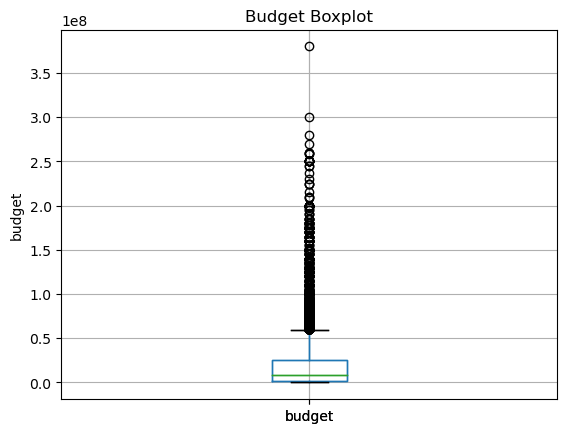

In [29]:
df.boxplot('budget',showbox = True, showfliers=False)
df.boxplot(column=['budget'])
plt.title('Budget Boxplot')
plt.ylabel('budget')
plt.show()

#### **cast**: Elenco do filme

In [30]:
df['cast'].head()

0    [{'cast_id': 14, 'character': 'Woody (voice)',...
1    [{'cast_id': 1, 'character': 'Alan Parrish', '...
2    [{'cast_id': 2, 'character': 'Max Goldman', 'c...
3    [{'cast_id': 1, 'character': "Savannah 'Vannah...
4    [{'cast_id': 1, 'character': 'George Banks', '...
Name: cast, dtype: object

In [31]:
type(df['cast'])

pandas.core.series.Series

In [32]:
df['cast'].dtypes

dtype('O')

#### **crew**: Equipe de filmagem do filme

In [33]:
df['crew'].head()

0    [{'credit_id': '52fe4284c3a36847f8024f49', 'de...
1    [{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...
2    [{'credit_id': '52fe466a9251416c75077a89', 'de...
3    [{'credit_id': '52fe44779251416c91011acb', 'de...
4    [{'credit_id': '52fe44959251416c75039ed7', 'de...
Name: crew, dtype: object

In [34]:
type(df['crew'])

pandas.core.series.Series

In [35]:
df['crew'].dtypes

dtype('O')

#### **genres**: Lista de dicionários com todos os gêneros associados ao filme


In [36]:
df['genres'].head()

0    [{'id': 16, 'name': 'Animation'}, {'id': 35, '...
1    [{'id': 12, 'name': 'Adventure'}, {'id': 14, '...
2    [{'id': 10749, 'name': 'Romance'}, {'id': 35, ...
3    [{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...
4                       [{'id': 35, 'name': 'Comedy'}]
Name: genres, dtype: object

In [37]:
type(df['genres'])

pandas.core.series.Series

In [38]:
df['genres'].dtypes

dtype('O')

#### **homepage**: Site oficial do filme

In [39]:
df['homepage'].head()

0    http://toystory.disney.com/toy-story
1                                     NaN
2                                     NaN
3                                     NaN
4                                     NaN
Name: homepage, dtype: object

In [40]:
df['homepage'].dtypes

dtype('O')

In [41]:
df.isnull().sum().sort_values(ascending=False)

belongs_to_collection    38979
homepage                 35975
budget                   34962
tagline                  24027
overview                   930
poster_path                379
runtime                    253
release_date                84
status                      82
imdb_id                     16
original_language           11
title                        3
spoken_languages             3
revenue                      3
production_countries         3
production_companies         3
vote_average                 3
popularity                   3
vote_count                   3
video                        3
keywords                     2
cast                         2
crew                         2
original_title               1
id                           0
genres                       0
adult                        0
dtype: int64

#### **id**: Identificação do filme

In [42]:
df['id'].head()

0      862.0
1     8844.0
2    15602.0
3    31357.0
4    11862.0
Name: id, dtype: float64

In [43]:
df['id'].dtypes

dtype('float64')

In [44]:
#Como o ID  está classificado como um objeto, precisamos corrigir isso
df['id'] = df['id'].astype(str)

In [45]:
df['id'].dtypes

dtype('O')

#### **imdb_id**: Identificação do filme no IMDb (Internet Movie Database)

In [46]:
df['imdb_id'].head()

0    tt0114709
1    tt0113497
2    tt0113228
3    tt0114885
4    tt0113041
Name: imdb_id, dtype: object

In [47]:
df['imdb_id'].dtypes

dtype('O')

In [48]:
df['imdb_id'] = df['imdb_id'].astype(str)

In [49]:
df['imdb_id'].dtypes

dtype('O')

#### **keywords**: Lista de dicionários com todas as palavras-chave do filme

In [50]:
df['keywords'].head()

0    [{'id': 931, 'name': 'jealousy'}, {'id': 4290,...
1    [{'id': 10090, 'name': 'board game'}, {'id': 1...
2    [{'id': 1495, 'name': 'fishing'}, {'id': 12392...
3    [{'id': 818, 'name': 'based on novel'}, {'id':...
4    [{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n...
Name: keywords, dtype: object

In [51]:
type(df['keywords'])

pandas.core.series.Series

In [52]:
df['keywords'].dtypes

dtype('O')

#### **original_language**: Idioma original do filme

In [53]:
df['original_language'].head()

0    en
1    en
2    en
3    en
4    en
Name: original_language, dtype: object

In [54]:
df['original_language'].nunique()

88

In [55]:
df['original_language'].unique()

array(['en', 'fr', 'zh', 'it', 'fa', 'nl', 'de', 'cn', 'ar', 'es', 'ru',
       'sv', 'ja', 'ko', 'sr', 'bn', 'he', 'pt', 'wo', 'ro', 'hu', 'cy',
       'vi', 'cs', 'da', 'no', 'nb', 'pl', 'el', 'sh', 'xx', 'mk', 'bo',
       'ca', 'fi', 'th', 'sk', 'hi', 'bs', 'tr', 'is', 'ps', 'ab', 'ka',
       'mn', 'bm', 'zu', 'uk', 'af', 'la', 'et', 'ku', 'fy', 'lv', 'ta',
       'sl', 'tl', 'ur', 'rw', 'id', 'bg', 'mr', 'lt', 'kk', 'ms', 'sq',
       nan, 'qu', 'te', 'am', 'jv', 'tg', 'ml', 'hr', 'lo', 'ay', 'kn',
       'eu', 'ne', 'pa', 'ky', 'gl', 'uz', 'sm', 'mt', 'hy', 'iu', 'lb',
       'si'], dtype=object)

<function matplotlib.pyplot.show(close=None, block=None)>

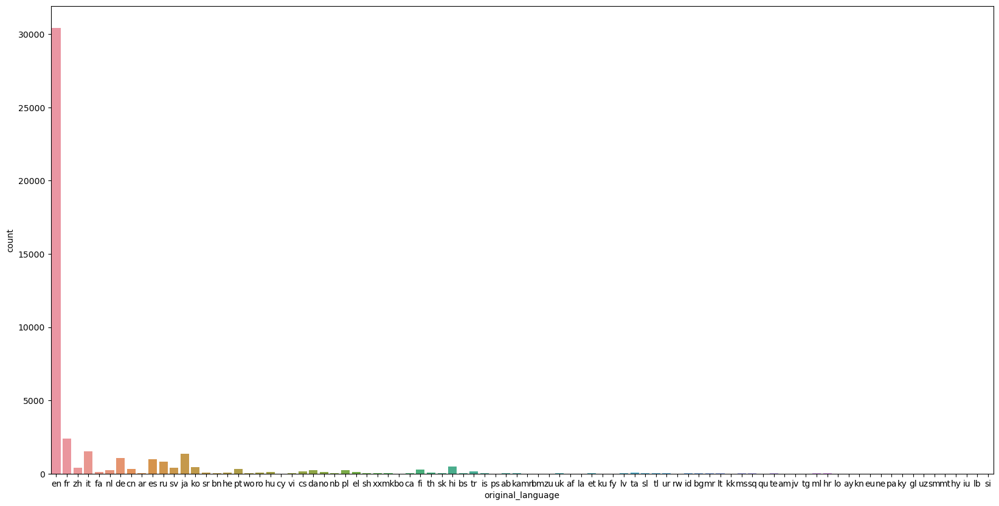

In [56]:
plt.figure(figsize=(20,10))
sns.countplot(x = 'original_language', data = df)
plt.show

In [57]:
df['original_language'].value_counts()

en    30421
fr     2371
it     1517
ja     1334
de     1044
      ...  
ay        1
fy        1
rw        1
qu        1
si        1
Name: original_language, Length: 88, dtype: int64

In [58]:
df['original_language'].describe()

count     43361
unique       88
top          en
freq      30421
Name: original_language, dtype: object

#### **original_title**: Título original do filme

In [59]:
df['original_title'].head()

0                      Toy Story
1                        Jumanji
2               Grumpier Old Men
3              Waiting to Exhale
4    Father of the Bride Part II
Name: original_title, dtype: object

In [60]:
df['original_title'].dtypes

dtype('O')

In [61]:
df['original_title'].nunique()

43371

In [62]:
df['original_title'].unique()

array(['Toy Story', 'Jumanji', 'Grumpier Old Men', ...,
       'Satana likuyushchiy', 'Queerama', nan], dtype=object)

In [63]:
df['original_title'].describe()

count         43371
unique        43371
top       Toy Story
freq              1
Name: original_title, dtype: object

#### **overview**: Breve descrição do filme

In [64]:
df['overview'].head()

0    Led by Woody, Andy's toys live happily in his ...
1    When siblings Judy and Peter discover an encha...
2    A family wedding reignites the ancient feud be...
3    Cheated on, mistreated and stepped on, the wom...
4    Just when George Banks has recovered from his ...
Name: overview, dtype: object

In [65]:
df['overview'].nunique()

42281

In [66]:
df['overview'].describe()

count                  42442
unique                 42281
top       No overview found.
freq                     132
Name: overview, dtype: object

#### **popularity**: Pontuação dada pelo TMDb

In [67]:
df['popularity'].head()

0    21.946943
1    17.015539
2    11.712900
3     3.859495
4     8.387519
Name: popularity, dtype: float64

In [68]:
df['popularity'].dtypes

dtype('float64')

In [69]:
#Como a Popularity  está classificada como um objeto, precisamos corrigir isso
#Ao executar o código abaixo, ele apresentou um erro, pois existem strings dentro dessa feature, vamos corrigir isso
df['popularity'] = pd.to_numeric(df['popularity'], errors = 'coerce')

In [70]:
df['popularity'].dtypes

dtype('float64')

In [71]:
df['popularity'].describe()

count    43369.000000
mean         2.892427
std          5.782464
min          0.000000
25%          0.383277
50%          1.125530
75%          3.652211
max        547.488298
Name: popularity, dtype: float64

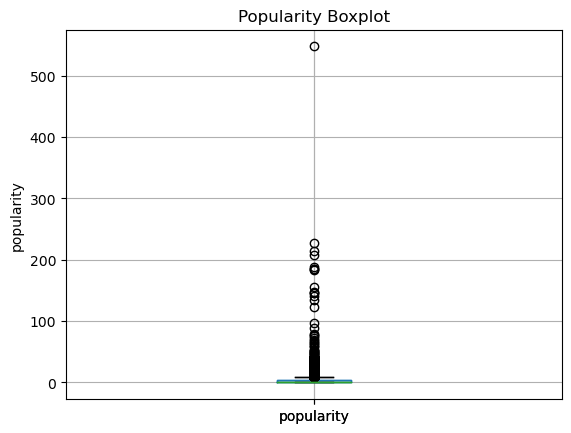

In [72]:
df.boxplot('popularity',showbox = True, showfliers=False)
df.boxplot(column=['popularity'])
plt.title("Popularity Boxplot")
plt.ylabel("popularity")
plt.show()

#### **poster_path**: Path do poster do filme

In [73]:
df['poster_path'].head()

0    /rhIRbceoE9lR4veEXuwCC2wARtG.jpg
1    /vzmL6fP7aPKNKPRTFnZmiUfciyV.jpg
2    /6ksm1sjKMFLbO7UY2i6G1ju9SML.jpg
3    /16XOMpEaLWkrcPqSQqhTmeJuqQl.jpg
4    /e64sOI48hQXyru7naBFyssKFxVd.jpg
Name: poster_path, dtype: object

In [74]:
df['poster_path'].dtypes

dtype('O')

In [75]:
df['poster_path'] = df['poster_path'].astype(str)

In [76]:
df['poster_path'].dtypes

dtype('O')

#### **production_companies**: Produtoras envolvidas na produção do filme

In [77]:
df['production_companies'].head()

0       [{'name': 'Pixar Animation Studios', 'id': 3}]
1    [{'name': 'TriStar Pictures', 'id': 559}, {'na...
2    [{'name': 'Warner Bros.', 'id': 6194}, {'name'...
3    [{'name': 'Twentieth Century Fox Film Corporat...
4    [{'name': 'Sandollar Productions', 'id': 5842}...
Name: production_companies, dtype: object

In [78]:
df['production_companies'].dtypes

dtype('O')

In [79]:
df['production_companies'].describe()

count     43369
unique    21728
top          []
freq      11368
Name: production_companies, dtype: object

#### **production_countries**: País onde o filme foi produzido

In [80]:
df['production_countries'].head()

0    [{'iso_3166_1': 'US', 'name': 'United States o...
1    [{'iso_3166_1': 'US', 'name': 'United States o...
2    [{'iso_3166_1': 'US', 'name': 'United States o...
3    [{'iso_3166_1': 'US', 'name': 'United States o...
4    [{'iso_3166_1': 'US', 'name': 'United States o...
Name: production_countries, dtype: object

In [81]:
df['production_countries'].dtypes

dtype('O')

In [82]:
df['production_countries'].describe()

count                                                 43369
unique                                                 2320
top       [{'iso_3166_1': 'US', 'name': 'United States o...
freq                                                  16853
Name: production_countries, dtype: object

In [83]:
df['production_countries'].nunique()

2320

In [84]:
df['production_countries'].unique()

array(["[{'iso_3166_1': 'US', 'name': 'United States of America'}]",
       "[{'iso_3166_1': 'DE', 'name': 'Germany'}, {'iso_3166_1': 'US', 'name': 'United States of America'}]",
       "[{'iso_3166_1': 'GB', 'name': 'United Kingdom'}, {'iso_3166_1': 'US', 'name': 'United States of America'}]",
       ...,
       "[{'iso_3166_1': 'PL', 'name': 'Poland'}, {'iso_3166_1': 'CZ', 'name': 'Czech Republic'}, {'iso_3166_1': 'SK', 'name': 'Slovakia'}]",
       "[{'iso_3166_1': 'CU', 'name': 'Cuba'}, {'iso_3166_1': 'DE', 'name': 'Germany'}, {'iso_3166_1': 'ES', 'name': 'Spain'}]",
       "[{'iso_3166_1': 'EG', 'name': 'Egypt'}, {'iso_3166_1': 'IT', 'name': 'Italy'}, {'iso_3166_1': 'US', 'name': 'United States of America'}]"],
      dtype=object)

#### **release_date**: Data de Lançamento do filme

In [85]:
df['release_date'].head()

0    1995-10-30
1    1995-12-15
2    1995-12-22
3    1995-12-22
4    1995-02-10
Name: release_date, dtype: object

In [86]:
df['release_date'] = pd.to_datetime(df['release_date'], format = '%Y-%m-%d', errors = 'coerce')

In [87]:
df['release_date'].head()

0   1995-10-30
1   1995-12-15
2   1995-12-22
3   1995-12-22
4   1995-02-10
Name: release_date, dtype: datetime64[ns]

In [88]:
df['release_date'].dtypes

dtype('<M8[ns]')

In [89]:
df['release_date'].describe()

count                   43288
unique                  16848
top       2008-01-01 00:00:00
freq                      128
first     1874-12-09 00:00:00
last      2021-09-30 00:00:00
Name: release_date, dtype: object

In [90]:
#Por curiosidade, quero ver qual é o último filme
df.loc[df['release_date'] == df['release_date'].max()]['original_title']

46629    NaN
Name: original_title, dtype: object

In [91]:
#Por curiosidade, quero ver qual é o primeiro filme
df.loc[df['release_date'] == df['release_date'].min()]['original_title']

35125    Passage de Venus
Name: original_title, dtype: object

#### **revenue**: Receita total do filme (em dólares)

In [92]:
df['revenue'].head()

0    373554033.0
1    262797249.0
2            0.0
3     81452156.0
4     76578911.0
Name: revenue, dtype: float64

In [93]:
df['revenue'].describe()

count    4.336900e+04
mean     1.094514e+07
std      6.309819e+07
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      0.000000e+00
max      2.787965e+09
Name: revenue, dtype: float64

In [94]:
df['revenue'].value_counts(normalize=True)

0.0            0.837580
11000000.0     0.000438
12000000.0     0.000438
10000000.0     0.000415
2000000.0      0.000392
                 ...   
18902015.0     0.000023
10626725.0     0.000023
62134225.0     0.000023
250993.0       0.000023
506863592.0    0.000023
Name: revenue, Length: 6539, dtype: float64

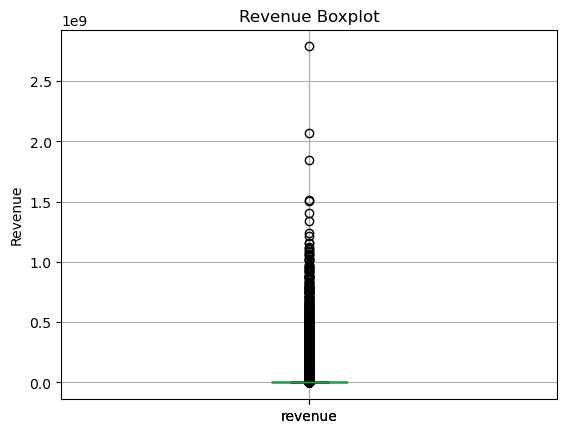

In [95]:
df.boxplot('revenue',showbox = True, showfliers=False)
df.boxplot(column=['revenue'])
plt.title('Revenue Boxplot')
plt.ylabel('Revenue')
plt.show()

#### **runtime**: Tempo de execução do filme (em minutos)

In [96]:
df['runtime'].head()

0     81.0
1    104.0
2    101.0
3    127.0
4    106.0
Name: runtime, dtype: float64

In [97]:
df['runtime'].dtypes

dtype('float64')

In [98]:
df['runtime'].describe().round(1)

count    43119.0
mean        93.8
std         37.7
min          0.0
25%         85.0
50%         95.0
75%        107.0
max       1256.0
Name: runtime, dtype: float64

In [99]:
#Tem um filme com 1256 minutos, fiquei curioso pra saber qual é
df.loc[df['runtime'] == df['runtime'].max()]['original_title']

24326    Centennial
Name: original_title, dtype: object

<Axes: >

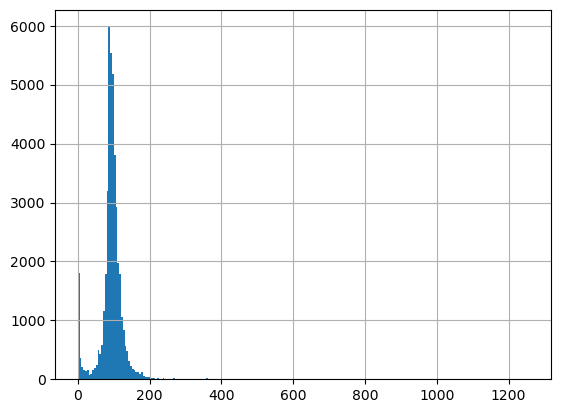

In [100]:
df['runtime'].hist(bins=250)

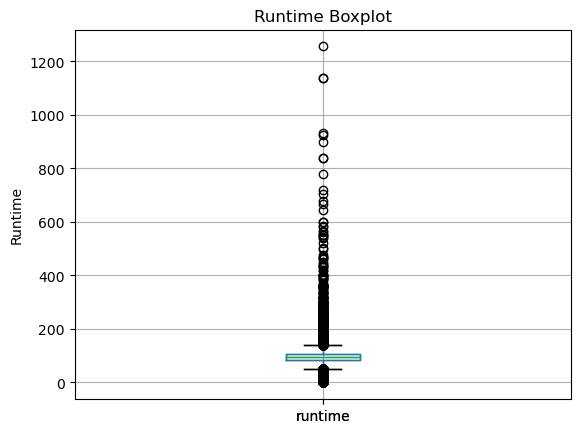

In [101]:
df.boxplot('runtime',showbox = True, showfliers=False)
df.boxplot(column=['runtime'])
plt.title('Runtime Boxplot')
plt.ylabel('Runtime')
plt.show()

#### **spoken_languages**: Idiomas falados no filme

In [102]:
df['spoken_languages'].head()

0             [{'iso_639_1': 'en', 'name': 'English'}]
1    [{'iso_639_1': 'en', 'name': 'English'}, {'iso...
2             [{'iso_639_1': 'en', 'name': 'English'}]
3             [{'iso_639_1': 'en', 'name': 'English'}]
4             [{'iso_639_1': 'en', 'name': 'English'}]
Name: spoken_languages, dtype: object

In [103]:
df['spoken_languages'].dtypes

dtype('O')

#### **status**: Status do filme (lançado, para ser lançado, anunciado, etc)

In [104]:
df['status'].head()

0    Released
1    Released
2    Released
3    Released
4    Released
Name: status, dtype: object

In [105]:
df['status'].nunique()

6

In [106]:
df['status'].unique()

array(['Released', nan, 'Rumored', 'Post Production', 'In Production',
       'Planned', 'Canceled'], dtype=object)

In [107]:
df['status'].value_counts()

Released           42939
Rumored              220
Post Production       95
In Production         20
Planned               14
Canceled               2
Name: status, dtype: int64

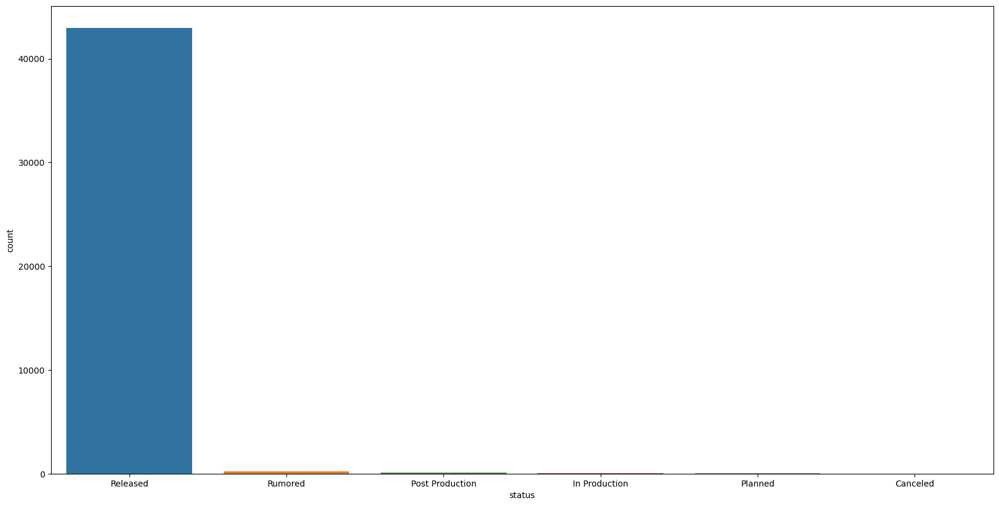

In [108]:
plt.figure(figsize=(20,10))
sns.countplot(x='status', data = df)
plt.show()

#### **tagline**: Tagline do filme

In [109]:
df['tagline'].head()

0                                                  NaN
1            Roll the dice and unleash the excitement!
2    Still Yelling. Still Fighting. Still Ready for...
3    Friends are the people who let you be yourself...
4    Just When His World Is Back To Normal... He's ...
Name: tagline, dtype: object

In [110]:
df['tagline'].describe()

count                      19345
unique                     19242
top       Based on a true story.
freq                           7
Name: tagline, dtype: object

####**title**: Título oficial do filme

In [111]:
df['title'].head()

0                      Toy Story
1                        Jumanji
2               Grumpier Old Men
3              Waiting to Exhale
4    Father of the Bride Part II
Name: title, dtype: object

In [112]:
df['title'].dtypes

dtype('O')

In [113]:
df['title'].nunique()

42220

#### **video**: Se o filme possui vídeo no TMDb

In [114]:
df['video'].head()

0    False
1    False
2    False
3    False
4    False
Name: video, dtype: object

In [115]:
df['video'].dtypes

dtype('O')

In [116]:
df['video'].nunique()

2

In [117]:
df['video'].unique()

array([False, True, nan], dtype=object)

#### **vote_average**: Avaliação média do filme

In [118]:
df['vote_average'].head()

0    7.7
1    6.9
2    6.5
3    6.1
4    5.7
Name: vote_average, dtype: float64

In [119]:
df['vote_average'].dtypes

dtype('float64')

In [120]:
df['vote_average'].describe()

count    43369.000000
mean         5.627185
std          1.927278
min          0.000000
25%          5.000000
50%          6.000000
75%          6.800000
max         10.000000
Name: vote_average, dtype: float64

<Axes: >

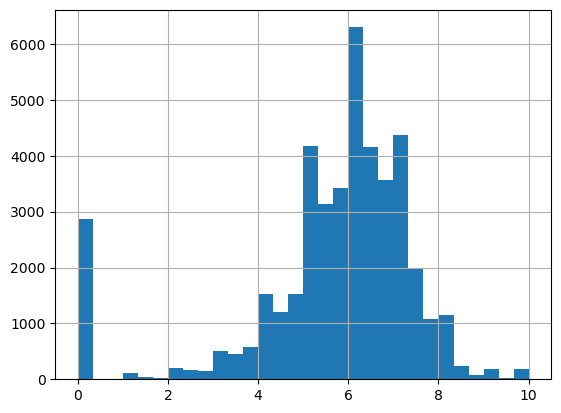

In [121]:
df['vote_average'].hist(bins=30)

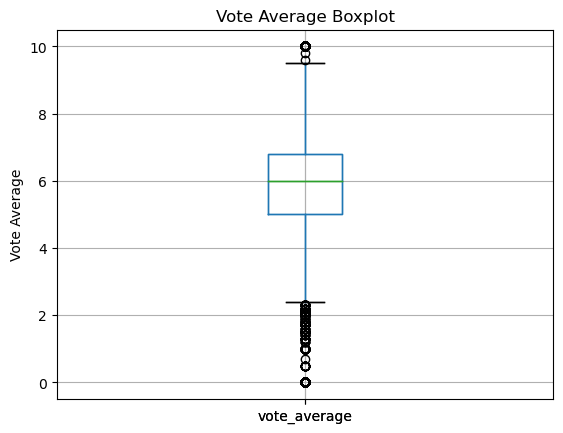

In [122]:
df.boxplot('vote_average',showbox = True, showfliers=False)
df.boxplot(column=['vote_average'])
plt.title('Vote Average Boxplot')
plt.ylabel('Vote Average')
plt.show()

In [123]:
#Por curiosidade
df.loc[df['vote_average'] == df['vote_average'].max()].head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,cast,crew
186,False,NaN,NaN,"[{'id': 14, 'name': 'Fantasy'}, {'id': 35, 'na...",NaN,58372.0,tt0114241,en,Reckless,"On Christmas eve, a relentlessly cheerful woma...",...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,The most twisted Christmas ever.,Reckless,False,10.0,1.0,"[{'id': 2754, 'name': 'trauma'}, {'id': 4325, ...","[{'cast_id': 1, 'character': 'Rachel', 'credit...","[{'credit_id': '561cd1ea9251415a7200351b', 'de..."
394,False,NaN,NaN,"[{'id': 10749, 'name': 'Romance'}, {'id': 12, ...",NaN,278939.0,tt0113173,en,Girl in the Cadillac,A runaway teenage girl and a drifter rob a ban...,...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,On our first date... we robbed a bank,Girl in the Cadillac,False,10.0,1.0,"[{'id': 642, 'name': 'robbery'}, {'id': 974, '...","[{'cast_id': 3, 'character': ""Amanda 'Mandy' B...","[{'credit_id': '545bb5590e0a261fa9002264', 'de..."
709,False,NaN,NaN,"[{'id': 99, 'name': 'Documentary'}]",NaN,73183.0,tt0113270,en,"The Haunted World of Edward D. Wood, Jr.",The strange life and the wonderfully awful fil...,...,[],Released,Can your MIND stand the SHOCKING TRUTH?,"The Haunted World of Edward D. Wood, Jr.",False,10.0,1.0,[],"[{'cast_id': 3, 'character': 'Herself', 'credi...","[{'credit_id': '52fe4890c3a368484e0ff711', 'de..."
741,False,NaN,NaN,"[{'id': 99, 'name': 'Documentary'}]",NaN,255546.0,tt0109381,pt,Carmen Miranda: Bananas Is My Business,A biography of the Portuguese-Brazilian singer...,...,"[{'iso_639_1': 'en', 'name': 'English'}, {'iso...",Released,NaN,Carmen Miranda: Bananas Is My Business,False,10.0,1.0,"[{'id': 3569, 'name': 'latin'}, {'id': 14709, ...","[{'cast_id': 2, 'character': 'Herself', 'credi...","[{'credit_id': '52fe4ef19251416c911431d5', 'de..."
1646,False,NaN,NaN,"[{'id': 18, 'name': 'Drama'}]",NaN,64562.0,tt0119845,en,Other Voices Other Rooms,Truman Capote's semi-autobiographical first no...,...,[],Released,NaN,Other Voices Other Rooms,False,10.0,1.0,[],"[{'cast_id': 0, 'character': 'Amy Skully', 'cr...",[]


In [124]:
#Por curiosidade
df.loc[df['vote_average'] == df['vote_average'].min()].head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,cast,crew
83,False,NaN,NaN,[],NaN,188588.0,tt0113612,en,Last Summer in the Hamptons,"Filmed entirely on location in East Hampton, L...",...,[],Released,NaN,Last Summer in the Hamptons,False,0.0,0.0,[],"[{'cast_id': 2, 'character': 'Oona Hart', 'cre...","[{'credit_id': '52fe4d3c9251416c7513477d', 'de..."
107,False,NaN,NaN,"[{'id': 80, 'name': 'Crime'}]",NaN,96357.0,tt0113276,en,Headless Body in Topless Bar,An ex-con holds a group of people hostage in a...,...,[],Released,NaN,Headless Body in Topless Bar,False,0.0,0.0,"[{'id': 156121, 'name': 'ex-con'}]","[{'cast_id': 1, 'character': 'Man', 'credit_id...","[{'credit_id': '58bc8c65c3a36851cd025bb8', 'de..."
126,False,NaN,NaN,[],NaN,290157.0,tt0110217,en,Jupiter's Wife,"Michel Negroponte, a documentary filmmaker, me...",...,[],Released,A Haunting Real Life Mystery,Jupiter's Wife,False,0.0,0.0,[],"[{'cast_id': 2, 'character': 'Herself', 'credi...","[{'credit_id': '5405dbddc3a368119c003c1e', 'de..."
132,False,NaN,NaN,"[{'id': 10402, 'name': 'Music'}, {'id': 99, 'n...",NaN,124636.0,tt0114500,en,Sonic Outlaws,Within days after the release of Negativland's...,...,"[{'iso_639_1': 'en', 'name': 'English'}]",Released,NaN,Sonic Outlaws,False,0.0,0.0,[],"[{'cast_id': 2, 'character': '', 'credit_id': ...","[{'credit_id': '52fe4ab0c3a368484e161d31', 'de..."
137,False,NaN,NaN,[],NaN,124639.0,tt0114618,en,Target,A subtle yet violent commentary on feudal lords.,...,[],Released,NaN,Target,False,0.0,0.0,[],[],"[{'credit_id': '52fe4ab0c3a368484e161d3d', 'de..."


#### **vote_count**: Número de votos contabilizados pelo TMDb

In [125]:
df['vote_count'].head()

0    5415.0
1    2413.0
2      92.0
3      34.0
4     173.0
Name: vote_count, dtype: float64

In [126]:
df['vote_count'].fillna(0, inplace = True)

In [127]:
df['vote_count'] = df['vote_count'].astype(int)

In [128]:
df['vote_count'].dtypes

dtype('int64')

In [129]:
df['vote_count'].describe()

count    43372.000000
mean       107.863622
std        486.023315
min          0.000000
25%          3.000000
50%         10.000000
75%         34.000000
max      14075.000000
Name: vote_count, dtype: float64

<Axes: >

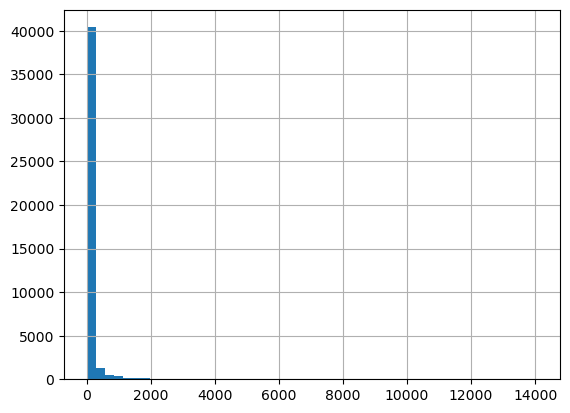

In [130]:
df['vote_count'].hist(bins=50)

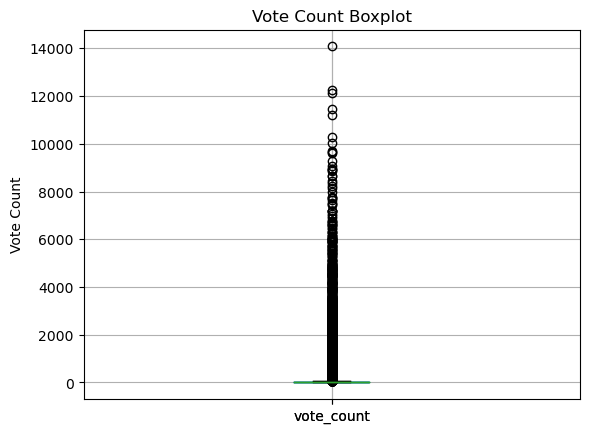

In [131]:
df.boxplot('vote_count',showbox = True, showfliers=False)
df.boxplot(column=['vote_count'])
plt.title('Vote Count Boxplot')
plt.ylabel('Vote Count')
plt.show()

In [132]:
#Por curiosidade
df.loc[df['vote_count']>20000]

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,spoken_languages,status,tagline,title,video,vote_average,vote_count,keywords,cast,crew


In [133]:
q1 = df['vote_count'].quantile(0.25)
q3 = df['vote_count'].quantile(0.75)
IQR = q3 - q1
print(IQR)

31.0


### Análise Multivariada

#### Retorno dos Filmes

In [134]:
df['return'] = df['revenue']/df['budget']

In [135]:
df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,status,tagline,title,video,vote_average,vote_count,keywords,cast,crew,return
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000.0,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862.0,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,Released,NaN,Toy Story,False,7.7,5415,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",12.451801
1,False,NaN,65000000.0,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844.0,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,Released,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413,"[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",4.043035
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",NaN,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602.0,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,Released,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",NaN
3,False,NaN,16000000.0,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357.0,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,Released,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",5.090760
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",NaN,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862.0,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,Released,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n...","[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",NaN


In [136]:
df.loc[df['return'] < 1 ][['original_title']]

,original_title
6,Sabrina
13,Nixon
14,Cutthroat Island
19,Money Train
22,Assassins
...,...
46562,Все и сразу
46565,Корпоратив
46571,Марс
46575,Про любоff


In [137]:
df['return'].describe().astype(int)

count        8410
mean         3561
std        173477
min             0
25%             0
50%             0
75%             2
max      12396383
Name: return, dtype: int64

In [138]:
df.loc[df['return'] == df['return'].max() ]

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,status,tagline,title,video,vote_average,vote_count,keywords,cast,crew,return
4015,False,NaN,1.0,"[{'id': 18, 'name': 'Drama'}, {'id': 80, 'name...",NaN,13703.0,tt0093407,en,Less Than Zero,A college freshman returns to Los Angeles for ...,...,Released,"In Beverly Hills, you can have anything your h...",Less Than Zero,False,6.1,77,"[{'id': 1824, 'name': 'self-destruction'}, {'i...","[{'cast_id': 1, 'character': 'Clay Easton', 'c...","[{'credit_id': '52fe458e9251416c7505a9eb', 'de...",12396383.0


#### Criando uma coluna com o Ano

In [139]:
df['year'] = pd.DatetimeIndex(df['release_date']).year

In [140]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43372 entries, 0 to 46629
Data columns (total 29 columns):
 #   Column                 Non-Null Count  Dtype         
---  ------                 --------------  -----         
 0   adult                  43372 non-null  bool          
 1   belongs_to_collection  4393 non-null   object        
 2   budget                 8410 non-null   float64       
 3   genres                 43372 non-null  object        
 4   homepage               7397 non-null   object        
 5   id                     43372 non-null  object        
 6   imdb_id                43372 non-null  object        
 7   original_language      43361 non-null  object        
 8   original_title         43371 non-null  object        
 9   overview               42442 non-null  object        
 10  popularity             43369 non-null  float64       
 11  poster_path            43372 non-null  object        
 12  production_companies   43369 non-null  object        
 13  p

In [141]:
df.isnull().sum()

adult                        0
belongs_to_collection    38979
budget                   34962
genres                       0
homepage                 35975
id                           0
imdb_id                      0
original_language           11
original_title               1
overview                   930
popularity                   3
poster_path                  0
production_companies         3
production_countries         3
release_date                84
revenue                      3
runtime                    253
spoken_languages             3
status                      82
tagline                  24027
title                        3
video                        3
vote_average                 3
vote_count                   0
keywords                     2
cast                         2
crew                         2
return                   34962
year                        84
dtype: int64

In [142]:
df.loc[df['year'].isna()]['id']

714      365371.0
737      215107.0
3475      94214.0
3643     207731.0
5912      99885.0
           ...   
46308    438910.0
46363    433711.0
46501    335251.0
46573    449131.0
46624    439050.0
Name: id, Length: 84, dtype: object

In [143]:
year_nan = df.loc[df['year'].isna()].index.tolist()

In [144]:
df.drop(index = year_nan, inplace = True)

In [145]:
df.isnull().sum()

adult                        0
belongs_to_collection    38898
budget                   34882
genres                       0
homepage                 35903
id                           0
imdb_id                      0
original_language           11
original_title               1
overview                   917
popularity                   0
poster_path                  0
production_companies         0
production_countries         0
release_date                 0
revenue                      0
runtime                    239
spoken_languages             0
status                      78
tagline                  23956
title                        0
video                        0
vote_average                 0
vote_count                   0
keywords                     2
cast                         2
crew                         2
return                   34882
year                         0
dtype: int64

In [146]:
df[['original_title', 'year', 'return']].sort_values('return', ascending = False)

,original_title,year,return
4015,Less Than Zero,1987.0,1.239638e+07
3357,Modern Times,1936.0,8.500000e+06
14465,웰컴 투 동막골,2005.0,4.197477e+06
22417,Aquí Entre Nos,2012.0,2.755584e+06
2320,"The Karate Kid, Part II",1986.0,1.018619e+06
...,...,...,...
46621,The Burkittsville 7,2000.0,NaN
46622,Caged Heat 3000,1995.0,NaN
46625,Siglo ng Pagluluwal,2011.0,NaN
46627,Satana likuyushchiy,1917.0,NaN


#### Palavras que aparecem com mais frequência

In [147]:
df['title']=df['title'].astype('str')

In [148]:
title_corpus = ' '.join(df['title'])
title_corpus

'Toy Story Jumanji Grumpier Old Men Waiting to Exhale Father of the Bride Part II Heat Sabrina Tom and Huck Sudden Death GoldenEye The American President Dracula: Dead and Loving It Balto Nixon Cutthroat Island Casino Sense and Sensibility Four Rooms Ace Ventura: When Nature Calls Money Train Get Shorty Copycat Assassins Powder Leaving Las Vegas Othello Now and Then Persuasion The City of Lost Children Shanghai Triad Dangerous Minds Twelve Monkeys Wings of Courage Babe Carrington Dead Man Walking Across the Sea of Time It Takes Two Clueless Cry, the Beloved Country Richard III Dead Presidents Restoration Mortal Kombat To Die For How To Make An American Quilt Se7en Pocahontas When Night Is Falling The Usual Suspects Guardian Angel Mighty Aphrodite Lamerica The Big Green Georgia Kids of the Round Table Home for the Holidays The Postman The Confessional The Indian in the Cupboard Eye for an Eye Mr. Holland\'s Opus Don\'t Be a Menace to South Central While Drinking Your Juice in the Hood T

In [149]:
title_wordcloud = WordCloud(stopwords= STOPWORDS, background_color='black', height=2000, width=4000).generate(title_corpus)

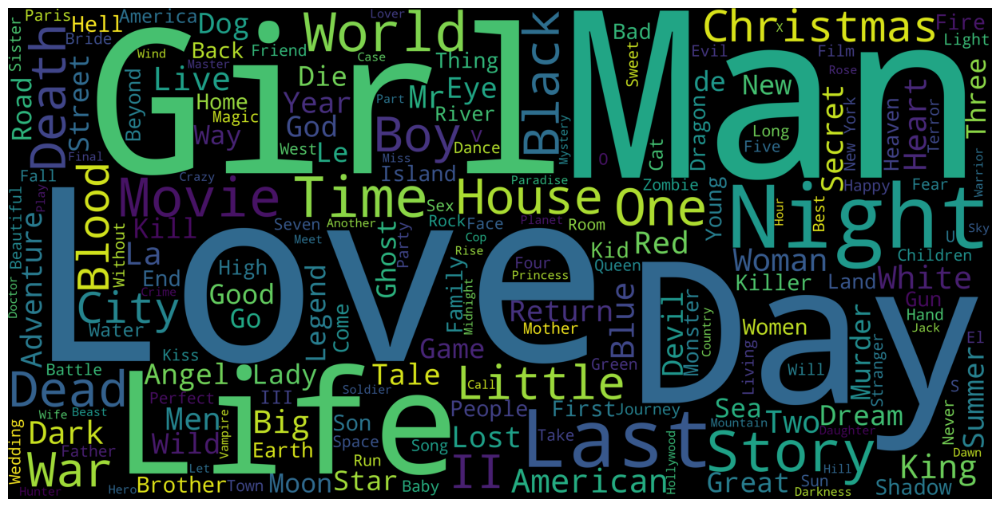

In [150]:
plt.figure(figsize=(16,8))
plt.imshow(title_wordcloud)
plt.axis('off')
plt.show()

In [151]:
df['overview']=df['overview'].astype('str')

In [152]:
overview_corpus = ' '.join(df['overview'])
overview_corpus

'Led by Woody, Andy\'s toys live happily in his room until Andy\'s birthday brings Buzz Lightyear onto the scene. Afraid of losing his place in Andy\'s heart, Woody plots against Buzz. But when circumstances separate Buzz and Woody from their owner, the duo eventually learns to put aside their differences. When siblings Judy and Peter discover an enchanted board game that opens the door to a magical world, they unwittingly invite Alan -- an adult who\'s been trapped inside the game for 26 years -- into their living room. Alan\'s only hope for freedom is to finish the game, which proves risky as all three find themselves running from giant rhinoceroses, evil monkeys and other terrifying creatures. A family wedding reignites the ancient feud between next-door neighbors and fishing buddies John and Max. Meanwhile, a sultry Italian divorcée opens a restaurant at the local bait shop, alarming the locals who worry she\'ll scare the fish away. But she\'s less interested in seafood than she is

In [153]:
overview_wordcloud = WordCloud(stopwords= STOPWORDS, background_color='black', height=2000, width=4000).generate(overview_corpus)

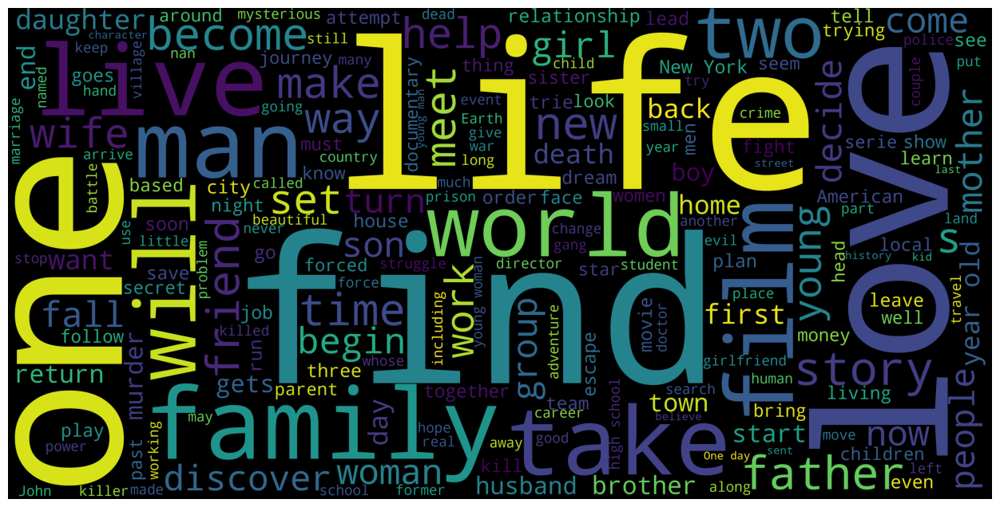

In [154]:
plt.figure(figsize=(16,8))
plt.imshow(overview_wordcloud)
plt.axis('off')
plt.show()

#### Palavras usadas em filmes com maiores retornos

In [155]:
df_return = df.loc[df['return']>5]

In [156]:
df_return.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,tagline,title,video,vote_average,vote_count,keywords,cast,crew,return,year
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000.0,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862.0,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,NaN,Toy Story,False,7.7,5415,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",12.451801,1995.0
3,False,NaN,16000000.0,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357.0,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",5.090760,1995.0
9,False,"{'id': 645, 'name': 'James Bond Collection', '...",58000000.0,"[{'id': 12, 'name': 'Adventure'}, {'id': 28, '...",http://www.mgm.com/view/movie/757/Goldeneye/,710.0,tt0113189,en,GoldenEye,James Bond must unmask the mysterious head of ...,...,No limits. No fears. No substitutes.,GoldenEye,False,6.6,1194,"[{'id': 701, 'name': 'cuba'}, {'id': 769, 'nam...","[{'cast_id': 1, 'character': 'James Bond', 'cr...","[{'credit_id': '52fe426ec3a36847f801e14b', 'de...",6.072311,1995.0
16,False,NaN,16500000.0,"[{'id': 18, 'name': 'Drama'}, {'id': 10749, 'n...",NaN,4584.0,tt0114388,en,Sense and Sensibility,"Rich Mr. Dashwood dies, leaving his second wif...",...,Lose your heart and come to your senses.,Sense and Sensibility,False,7.2,364,"[{'id': 420, 'name': 'bowling'}, {'id': 818, '...","[{'cast_id': 6, 'character': 'Marianne Dashwoo...","[{'credit_id': '52fe43cec3a36847f807101f', 'de...",8.181818,1995.0
18,False,"{'id': 3167, 'name': 'Ace Ventura Collection',...",30000000.0,"[{'id': 80, 'name': 'Crime'}, {'id': 35, 'name...",NaN,9273.0,tt0112281,en,Ace Ventura: When Nature Calls,"Summoned from an ashram in Tibet, Ace finds hi...",...,New animals. New adventures. Same hair.,Ace Ventura: When Nature Calls,False,6.1,1128,"[{'id': 409, 'name': 'africa'}, {'id': 1551, '...","[{'cast_id': 1, 'character': 'Ace Ventura', 'c...","[{'credit_id': '52fe44dfc3a36847f80af28b', 'de...",7.079518,1995.0


In [157]:
df_return['title']=df_return['title'].astype('str')

In [158]:
title_return_corpus = ' '.join(df_return['title'])
title_return_corpus

"Toy Story Waiting to Exhale GoldenEye Sense and Sensibility Ace Ventura: When Nature Calls Leaving Las Vegas Twelve Monkeys Babe Mortal Kombat Se7en Pocahontas Friday The Bridges of Madison County Taxi Driver The Birdcage Bad Boys Apollo 13 Casper The Net Clerks Dumb and Dumber Hoop Dreams Star Wars Like Water for Chocolate Legends of the Fall Pulp Fiction The Santa Clause While You Were Sleeping Muriel's Wedding Ace Ventura: Pet Detective The Crow The Flintstones Forrest Gump Four Weddings and a Funeral The Lion King The Mask Speed The Firm Free Willy The Fugitive Hot Shots! Part Deux In the Name of the Father Jurassic Park Menace II Society Mrs. Doubtfire Philadelphia The Piano Schindler's List Sleepless in Seattle Home Alone Ghost Aladdin Terminator 2: Judgment Day Dances with Wolves Batman The Silence of the Lambs Snow White and the Seven Dwarfs Beauty and the Beast Pinocchio Pretty Woman Fargo The Aristocats Mission: Impossible Twister Dr. Strangelove or: How I Learned to Stop Wo

In [159]:
title_return_wordcloud = WordCloud(stopwords= STOPWORDS, background_color='black', height=2000, width=4000).generate(title_return_corpus)

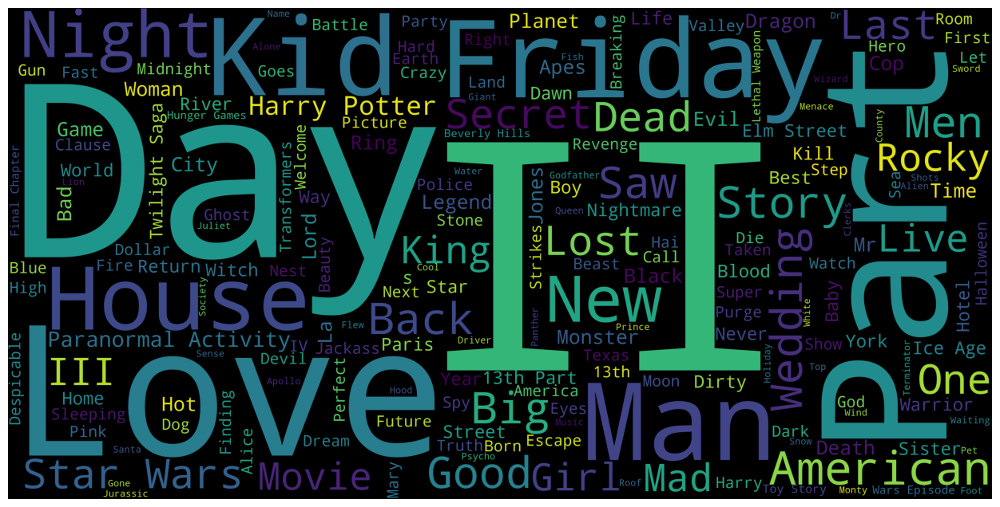

In [160]:
plt.figure(figsize=(16,8))
plt.imshow(title_return_wordcloud)
plt.axis('off')
plt.show()

#### Idiomas mais representativos

In [161]:
df_lang = pd.DataFrame(df['original_language'].value_counts())
df_lang['language'] = df_lang.index
df_lang.columns = ['number', 'language']
df_lang

,number,language
en,30357,en
fr,2370,fr
it,1516,it
ja,1333,ja
de,1042,de
...,...,...
ay,1,ay
fy,1,fy
rw,1,rw
qu,1,qu


In [162]:
df['original_language'].nunique()

88

<Axes: xlabel='language', ylabel='number'>

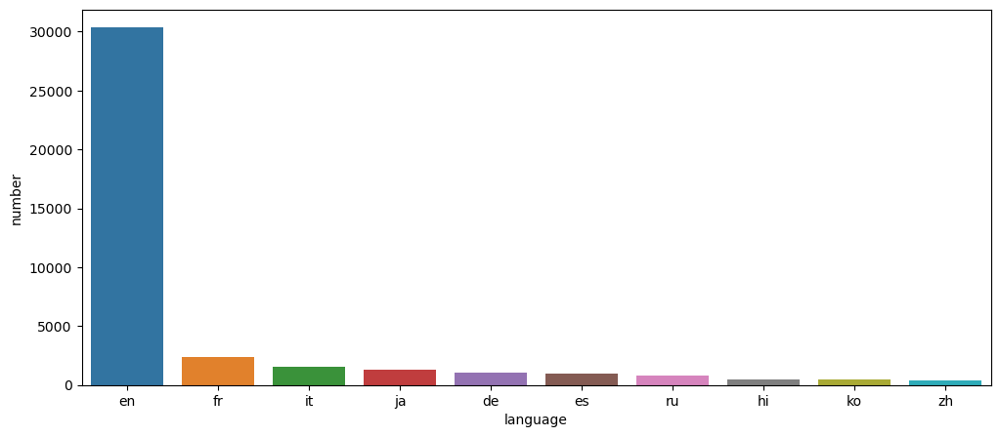

In [163]:
plt.figure(figsize=(12,5))
sns.barplot(x = 'language', y = 'number', data=df_lang[0:10])

#### Popularidade

In [164]:
df['popularity'].describe()

count    43288.000000
mean         2.897517
std          5.786526
min          0.000000
25%          0.386310
50%          1.129017
75%          3.662463
max        547.488298
Name: popularity, dtype: float64

<Axes: >

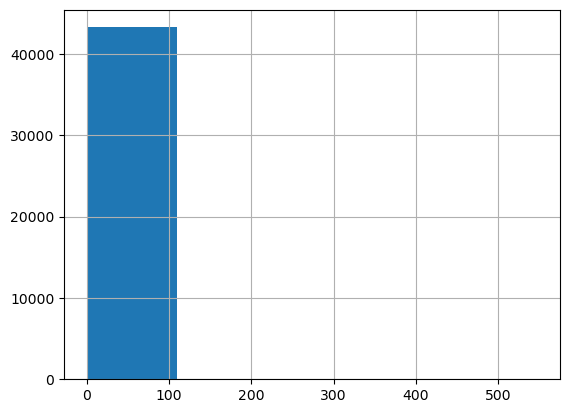

In [165]:
df['popularity'].hist(bins=5)

In [166]:
df[['original_title', 'popularity', 'year']].sort_values('popularity', ascending=False).head(20)

,original_title,popularity,year
30876,Minions,547.488298,2015.0
44798,Baby Driver,228.032744,2017.0
24603,Big Hero 6,213.849907,2014.0
46629,NaN,206.904000,2021.0
26729,Deadpool,187.860492,2016.0
26731,Guardians of the Galaxy Vol. 2,185.330992,2017.0
14644,Avatar,185.070892,2009.0
24499,John Wick,183.870374,2014.0
23820,Gone Girl,154.801009,2014.0
25024,The Hunger Games: Mockingjay - Part 1,147.098006,2014.0


#### Contagem de Votos

In [167]:
df[['original_title', 'vote_count', 'year']].sort_values('vote_count', ascending=False).head(20)

,original_title,vote_count,year
15576,Inception,14075,2010.0
12541,The Dark Knight,12269,2008.0
14644,Avatar,12114,2009.0
26729,Deadpool,11444,2016.0
23018,Interstellar,11187,2014.0
20172,Django Unchained,10297,2012.0
23898,Guardians of the Galaxy,10014,2014.0
2858,Fight Club,9678,1999.0
18360,The Hunger Games,9634,2012.0
26718,Mad Max: Fury Road,9629,2015.0


<Axes: xlabel='vote_average', ylabel='Density'>

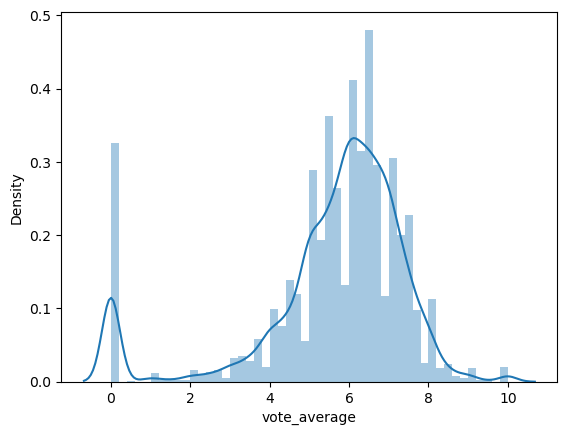

In [168]:
sns.distplot(df['vote_average'].fillna((df['vote_average'].median())))

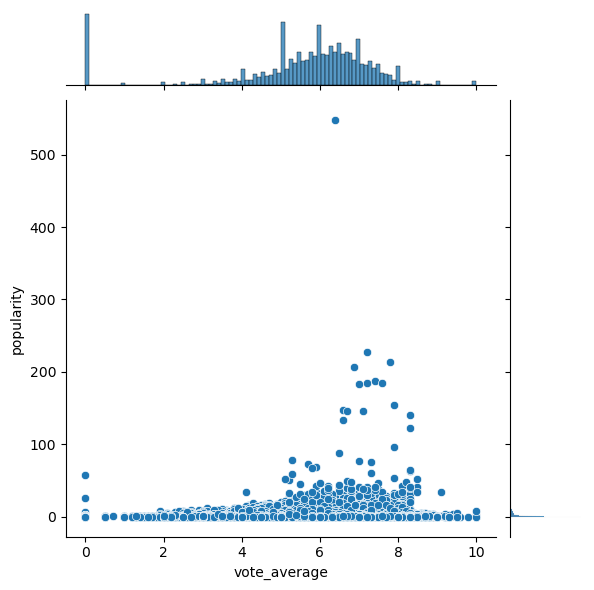

In [169]:
sns.jointplot(x = 'vote_average', y = 'popularity', data=df)

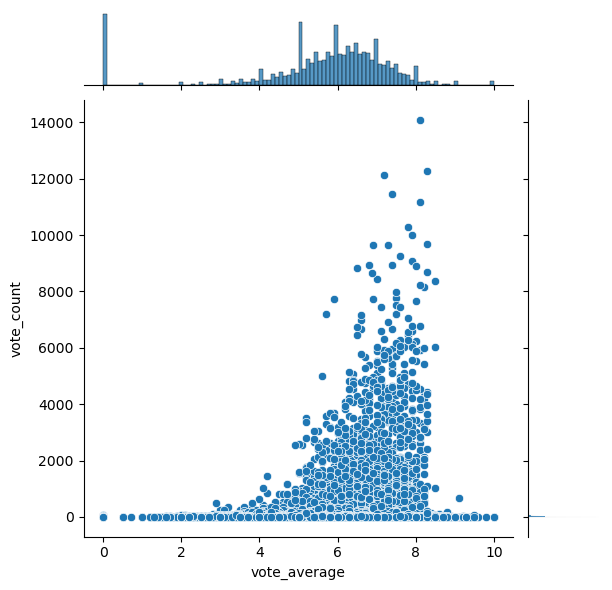

In [170]:
sns.jointplot(x = 'vote_average', y = 'vote_count', data=df)

#### Quais meses são lançados mais filmes?

In [171]:
df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,tagline,title,video,vote_average,vote_count,keywords,cast,crew,return,year
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000.0,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862.0,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,NaN,Toy Story,False,7.7,5415,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",12.451801,1995.0
1,False,NaN,65000000.0,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844.0,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,Roll the dice and unleash the excitement!,Jumanji,False,6.9,2413,"[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",4.043035,1995.0
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",NaN,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602.0,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,Still Yelling. Still Fighting. Still Ready for...,Grumpier Old Men,False,6.5,92,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",NaN,1995.0
3,False,NaN,16000000.0,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357.0,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,Friends are the people who let you be yourself...,Waiting to Exhale,False,6.1,34,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",5.090760,1995.0
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",NaN,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862.0,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,Just When His World Is Back To Normal... He's ...,Father of the Bride Part II,False,5.7,173,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n...","[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",NaN,1995.0


In [172]:
df['month'] = pd.DatetimeIndex(df['release_date']).month

In [173]:
df.head()

,adult,belongs_to_collection,budget,genres,homepage,id,imdb_id,original_language,original_title,overview,...,title,video,vote_average,vote_count,keywords,cast,crew,return,year,month
0,False,"{'id': 10194, 'name': 'Toy Story Collection', ...",30000000.0,"[{'id': 16, 'name': 'Animation'}, {'id': 35, '...",http://toystory.disney.com/toy-story,862.0,tt0114709,en,Toy Story,"Led by Woody, Andy's toys live happily in his ...",...,Toy Story,False,7.7,5415,"[{'id': 931, 'name': 'jealousy'}, {'id': 4290,...","[{'cast_id': 14, 'character': 'Woody (voice)',...","[{'credit_id': '52fe4284c3a36847f8024f49', 'de...",12.451801,1995.0,10
1,False,NaN,65000000.0,"[{'id': 12, 'name': 'Adventure'}, {'id': 14, '...",NaN,8844.0,tt0113497,en,Jumanji,When siblings Judy and Peter discover an encha...,...,Jumanji,False,6.9,2413,"[{'id': 10090, 'name': 'board game'}, {'id': 1...","[{'cast_id': 1, 'character': 'Alan Parrish', '...","[{'credit_id': '52fe44bfc3a36847f80a7cd1', 'de...",4.043035,1995.0,12
2,False,"{'id': 119050, 'name': 'Grumpy Old Men Collect...",NaN,"[{'id': 10749, 'name': 'Romance'}, {'id': 35, ...",NaN,15602.0,tt0113228,en,Grumpier Old Men,A family wedding reignites the ancient feud be...,...,Grumpier Old Men,False,6.5,92,"[{'id': 1495, 'name': 'fishing'}, {'id': 12392...","[{'cast_id': 2, 'character': 'Max Goldman', 'c...","[{'credit_id': '52fe466a9251416c75077a89', 'de...",NaN,1995.0,12
3,False,NaN,16000000.0,"[{'id': 35, 'name': 'Comedy'}, {'id': 18, 'nam...",NaN,31357.0,tt0114885,en,Waiting to Exhale,"Cheated on, mistreated and stepped on, the wom...",...,Waiting to Exhale,False,6.1,34,"[{'id': 818, 'name': 'based on novel'}, {'id':...","[{'cast_id': 1, 'character': ""Savannah 'Vannah...","[{'credit_id': '52fe44779251416c91011acb', 'de...",5.090760,1995.0,12
4,False,"{'id': 96871, 'name': 'Father of the Bride Col...",NaN,"[{'id': 35, 'name': 'Comedy'}]",NaN,11862.0,tt0113041,en,Father of the Bride Part II,Just when George Banks has recovered from his ...,...,Father of the Bride Part II,False,5.7,173,"[{'id': 1009, 'name': 'baby'}, {'id': 1599, 'n...","[{'cast_id': 1, 'character': 'George Banks', '...","[{'credit_id': '52fe44959251416c75039ed7', 'de...",NaN,1995.0,2


<Axes: title={'center': 'Numero de filmes lançados por mês'}, xlabel='month', ylabel='count'>

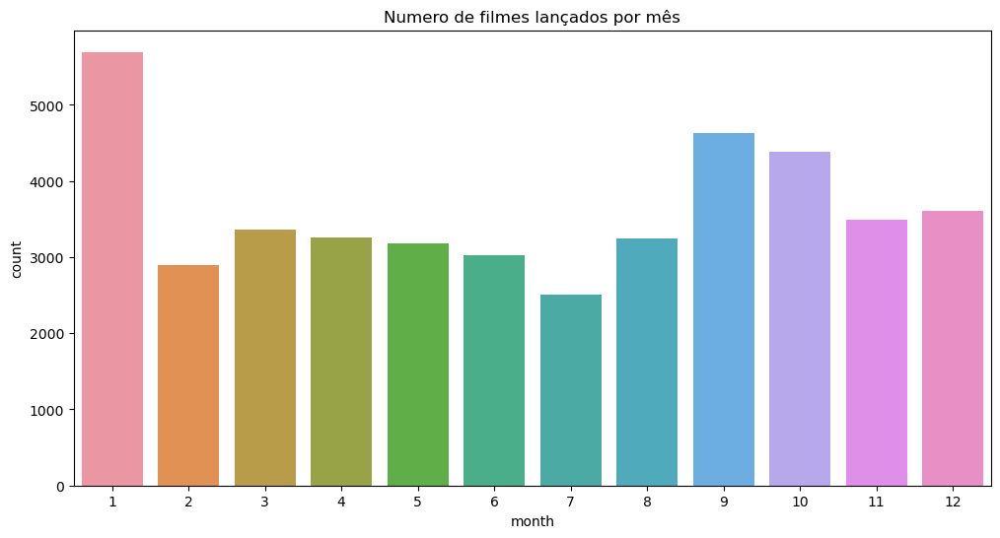

In [174]:
plt.figure(figsize=(12,6))
plt.title('Numero de filmes lançados por mês')
sns.countplot(x = 'month', data=df)

(0.0, 12.0)

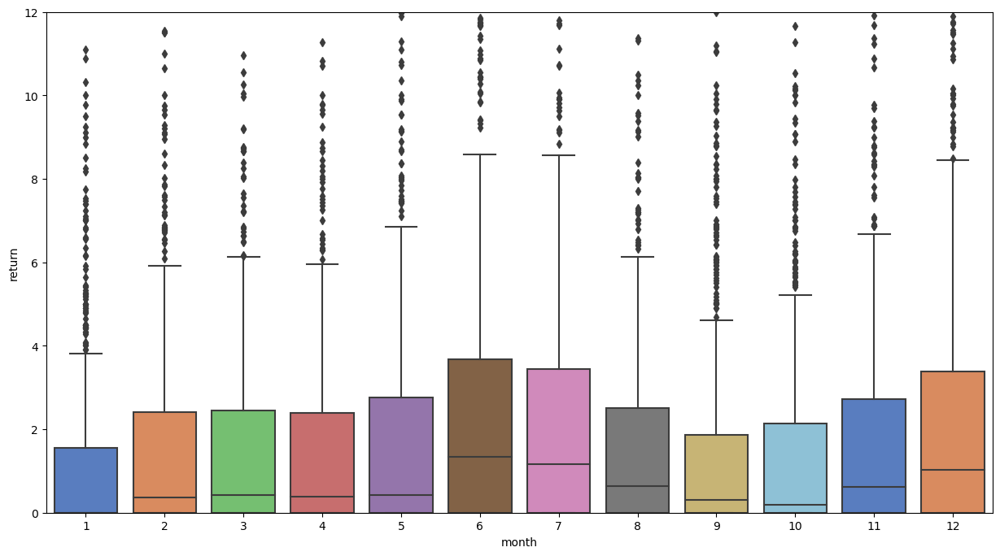

In [175]:
fig, ax = plt.subplots(nrows = 1, ncols = 1, figsize=(15,8))
sns.boxplot(x='month', y='return', data=df[df['return'].notnull()], palette='muted', ax=ax)
ax.set_ylim([0,12])

#### Número de filmes lançados por ano

In [176]:
year_count = df.groupby('year')['original_title'].count()
year_count

year
1874.0       1
1878.0       1
1883.0       1
1887.0       1
1888.0       2
          ... 
2016.0    1498
2017.0     492
2018.0       5
2020.0       1
2021.0       0
Name: original_title, Length: 136, dtype: int64

<Axes: xlabel='year'>

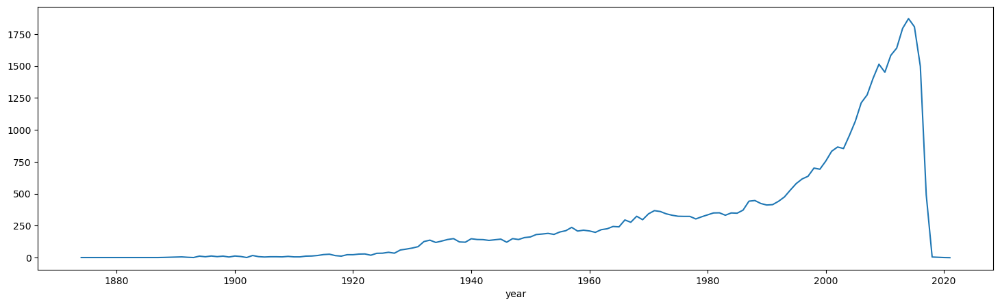

In [177]:
plt.figure(figsize=(18,5))
year_count.plot()

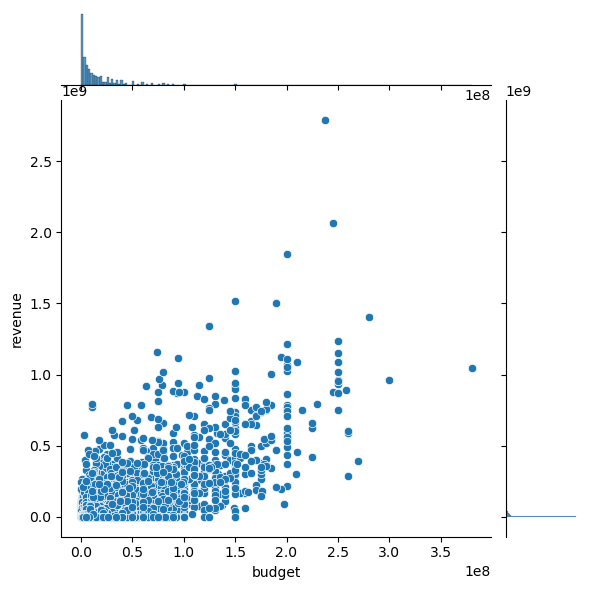

In [178]:
sns.jointplot(x='budget', y='revenue', data=df.loc[df['return'].notnull()])

### Pre Data Prep

#### Removendo filmes adultos

In [179]:
df_modif = df.loc[df['adult'] == False]

In [180]:
df_modif.shape

(43280, 30)

Ainda temos 44k filmes, precisamos continuar

#### Removendo os filmes com poucos votos

In [181]:
df_modif['vote_count'].describe()

count    43280.000000
mean       108.089834
std        486.514803
min          0.000000
25%          3.000000
50%         10.000000
75%         34.000000
max      14075.000000
Name: vote_count, dtype: float64

<Axes: >

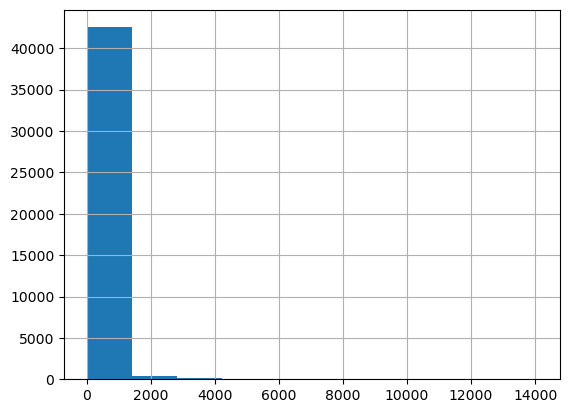

In [182]:
df_modif['vote_count'].hist()

In [183]:
df_modif.loc[df_modif['vote_count'] > 100].shape

(5675, 30)

In [184]:
df_modif = df_modif.loc[df_modif['vote_count'] > 100]

In [185]:
df_modif.describe()

,budget,popularity,revenue,runtime,vote_average,vote_count,return,year,month
count,4.072000e+03,5675.000000,5.675000e+03,5675.000000,5675.000000,5675.000000,4.072000e+03,5675.000000,5675.000000
mean,3.627046e+07,10.623538,7.851665e+07,106.306608,6.440278,722.178150,2.592818e+03,2000.936740,6.922996
std,4.224829e+07,12.256424,1.577743e+08,25.979265,0.857990,1169.917464,1.350604e+05,15.450059,3.390758
min,1.000000e+00,0.005007,0.000000e+00,0.000000,2.800000,101.000000,0.000000e+00,1902.000000,1.000000
25%,8.000000e+06,6.744605,0.000000e+00,94.000000,5.900000,161.000000,6.607198e-01,1995.000000,4.000000
50%,2.200000e+07,8.959821,1.962976e+07,103.000000,6.500000,300.000000,2.085593e+00,2006.000000,7.000000
75%,4.992500e+07,11.901264,8.560743e+07,117.000000,7.100000,716.500000,4.276076e+00,2012.000000,10.000000
max,3.800000e+08,547.488298,2.787965e+09,705.000000,9.100000,14075.000000,8.500000e+06,2021.000000,12.000000


In [186]:
df_modif.to_csv('../content/movies_dataframe.csv', sep=';', index=False)